# Prepare Image Resizing

Set up dataframe of information about images for resizing operations (including source and destination paths)

Remove images smaller than 256x256 pixels

Create sample resized images for testing

In [23]:
# Packages
import pandas as pd
import os
import shutil
import time
import matplotlib.pyplot as plt

# Importing the image processing functions
from Image_Processing_Functions import *

In [24]:
# Load in selected cars annos
selected_cars_annos = pd.read_excel("~/Box/INFO 290T Project/Intermediate Data/selected_cars_annos.xlsx")
selected_cars_annos

,Class,x1,y1,x2,y2,old_class,old_class_name,width,height,num_pixels,test_80_20,orig_train_or_test,new_file_path,new_file_name
0,SUV,111,54,365,190,1,AM General Hummer SUV 2000,373,216,80568,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_00684.jpg
1,SUV,45,39,729,414,1,AM General Hummer SUV 2000,800,600,480000,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01117.jpg
2,SUV,26,62,763,504,1,AM General Hummer SUV 2000,800,520,416000,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01518.jpg
3,SUV,32,69,487,316,1,AM General Hummer SUV 2000,500,353,176500,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01538.jpg
4,SUV,46,115,623,469,1,AM General Hummer SUV 2000,786,491,385926,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01802.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8436,Convertible,20,27,613,413,196,smart fortwo Convertible 2012,630,420,264600,0,train,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07500.jpg
8437,Convertible,29,34,381,273,196,smart fortwo Convertible 2012,400,300,120000,0,train,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07594.jpg
8438,Convertible,78,289,669,633,196,smart fortwo Convertible 2012,1024,683,699392,0,train,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07846.jpg
8439,Convertible,31,6,494,272,196,smart fortwo Convertible 2012,500,272,136000,0,train,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07895.jpg


## Limit to 256x256 and above

In [25]:
selected_cars_annos_resizable = selected_cars_annos.query('width >= 256 and height >= 256')
selected_cars_annos_resizable

,Class,x1,y1,x2,y2,old_class,old_class_name,width,height,num_pixels,test_80_20,orig_train_or_test,new_file_path,new_file_name
1,SUV,45,39,729,414,1,AM General Hummer SUV 2000,800,600,480000,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01117.jpg
2,SUV,26,62,763,504,1,AM General Hummer SUV 2000,800,520,416000,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01518.jpg
3,SUV,32,69,487,316,1,AM General Hummer SUV 2000,500,353,176500,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01538.jpg
4,SUV,46,115,623,469,1,AM General Hummer SUV 2000,786,491,385926,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01802.jpg
5,SUV,11,60,796,535,1,AM General Hummer SUV 2000,800,580,464000,0,test,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01887.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8436,Convertible,20,27,613,413,196,smart fortwo Convertible 2012,630,420,264600,0,train,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07500.jpg
8437,Convertible,29,34,381,273,196,smart fortwo Convertible 2012,400,300,120000,0,train,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07594.jpg
8438,Convertible,78,289,669,633,196,smart fortwo Convertible 2012,1024,683,699392,0,train,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07846.jpg
8439,Convertible,31,6,494,272,196,smart fortwo Convertible 2012,500,272,136000,0,train,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07895.jpg


## Prepare Filepaths

In [26]:
# Rename new_file_path to source_file_path
selected_cars_annos_resizable = selected_cars_annos_resizable.rename(columns={'new_file_path': 'source_file_path'})
# Create destination_file_name as new_file_name with the last ".jpg" replaced with "_resized.jpg"
selected_cars_annos_resizable['destination_file_name'] = selected_cars_annos_resizable['new_file_name'].apply(lambda x: x[:x.rfind('.jpg')] + '_resized.jpg')
# Print source_file_path and destination_file_path for first row
print(os.path.expanduser(selected_cars_annos_resizable.iloc[0]['source_file_path']))
print(selected_cars_annos_resizable.iloc[0]['destination_file_name'])
# Create destination_file_path as source_file_path with "Selected Images" replaced with "Resized Images" and with the last ".jpg" replaced with "_resized.jpg"
selected_cars_annos_resizable['destination_file_path'] = selected_cars_annos_resizable['source_file_path'].apply(lambda x: x.replace('Selected Images', 'Resized Images')).apply(lambda x: x[:x.rfind('.jpg')] + '_resized.jpg')
print(os.path.expanduser(selected_cars_annos_resizable.iloc[0]['destination_file_path']))

C:\Users\ijyli/Box/INFO 290T Project/Intermediate Data/Selected Images/train/SUV_train_orig_test_01117.jpg
SUV_train_orig_test_01117_resized.jpg
C:\Users\ijyli/Box/INFO 290T Project/Intermediate Data/Resized Images/train/SUV_train_orig_test_01117_resized.jpg


## Modify and Save Excel File

In [27]:
# Create df resized_cars_annos
# Keep columns Class, old_class_name, test_80_20, source_file_path renamed to orig_res_file_path, destination_file_path renamed to resized_file_path
resized_cars_annos = selected_cars_annos_resizable[['Class', 'old_class_name', 'width', 'height', 'test_80_20', 'source_file_path', 'destination_file_path', 'destination_file_name']]
resized_cars_annos = resized_cars_annos.rename(columns={'source_file_path': 'orig_res_file_path', 'destination_file_path': 'resized_file_path', 'width': 'orig_width', 'height': 'orig_height'})
resized_cars_annos

,Class,old_class_name,orig_width,orig_height,test_80_20,orig_res_file_path,resized_file_path,destination_file_name
1,SUV,AM General Hummer SUV 2000,800,600,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,SUV_train_orig_test_01117_resized.jpg
2,SUV,AM General Hummer SUV 2000,800,520,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,SUV_train_orig_test_01518_resized.jpg
3,SUV,AM General Hummer SUV 2000,500,353,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,SUV_train_orig_test_01538_resized.jpg
4,SUV,AM General Hummer SUV 2000,786,491,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,SUV_train_orig_test_01802_resized.jpg
5,SUV,AM General Hummer SUV 2000,800,580,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,SUV_train_orig_test_01887_resized.jpg
...,...,...,...,...,...,...,...,...
8436,Convertible,smart fortwo Convertible 2012,630,420,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,Convertible_train_orig_train_07500_resized.jpg
8437,Convertible,smart fortwo Convertible 2012,400,300,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,Convertible_train_orig_train_07594_resized.jpg
8438,Convertible,smart fortwo Convertible 2012,1024,683,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,Convertible_train_orig_train_07846_resized.jpg
8439,Convertible,smart fortwo Convertible 2012,500,272,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,~/Box/INFO 290T Project/Intermediate Data/Resi...,Convertible_train_orig_train_07895_resized.jpg


In [28]:
# Save resized_cars_annos to ~/Box/INFO 290T Project/Intermediate Data/resized_cars_annos.xlsx
resized_cars_annos.to_excel("~/Box/INFO 290T Project/Intermediate Data/resized_cars_annos.xlsx", index=False)

## Testing resizing on 10 images

In [29]:
# Draw first 10 images
resizing_sample = resized_cars_annos.head(10)

In [30]:
# Function for Sample runs
def sample_run(run_name = 'Defaults', blur = True, blur_sigma = 0.75, target_size = 256, display_images = True, timer = True):

    # Change destination file path
    resizing_sample['destination_file_path'] = "~/Box/INFO 290T Project/Intermediate Data/Small Resized Sample/" + run_name + "/" + resizing_sample['destination_file_name']

    # Clear the folder
    shutil.rmtree(os.path.expanduser("~/Box/INFO 290T Project/Intermediate Data/Small Resized Sample/" + run_name), ignore_errors=True)
    os.makedirs(os.path.expanduser("~/Box/INFO 290T Project/Intermediate Data/Small Resized Sample/" + run_name), exist_ok=True)

    # Start the timer
    if timer:
        sample_start_time = time.time()
    
    # Iterate through the sample and process each image
    for _, row in resizing_sample.iterrows():
        process_image(row['orig_res_file_path'], row['destination_file_path'], blur = blur, blur_sigma = blur_sigma, target_size = target_size)

    # Display images if display_images is True
    if display_images:
        for _, row in resizing_sample.iterrows():
            display_img = plt.imread(os.path.expanduser(row['destination_file_path']))
            plt.imshow(display_img)
            plt.show()

    # End the timer
    if timer:
        # End timing run
        sample_end_time = time.time()
        # Sample time taken in minutes
        sample_time_taken = (sample_end_time - sample_start_time) / 60
        print('Sample time taken: ', sample_time_taken, ' minutes')
        # Estimate time for full run
        full_time_est = sample_time_taken * len(selected_cars_annos_resizable) / 10
        print('Full run time estimated: ', full_time_est, ' minutes')

### Preferred/Default Settings: Blur with Sigma 0.75, Target Size 256x256

C:\Users\ijyli\AppData\Local\Temp\ipykernel_9968\1240829104.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resizing_sample['destination_file_path'] = "~/Box/INFO 290T Project/Intermediate Data/Small Resized Sample/" + run_name + "/" + resizing_sample['destination_file_name']


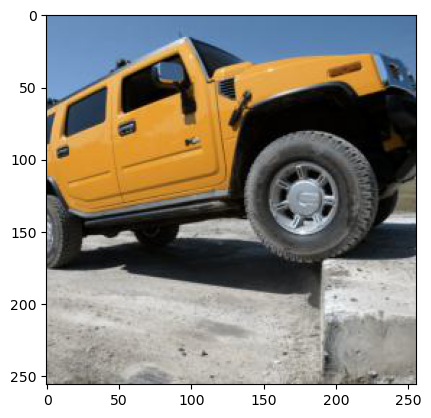

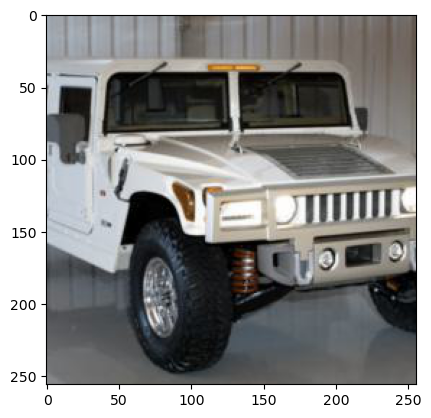

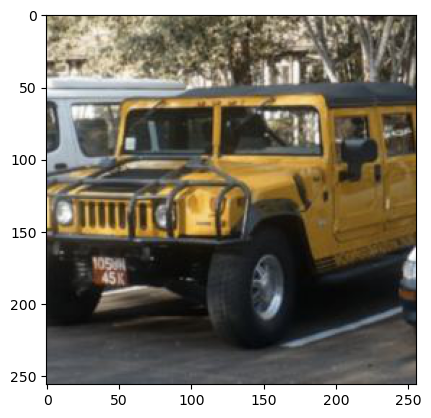

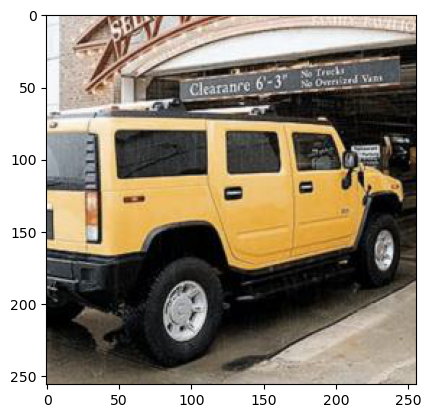

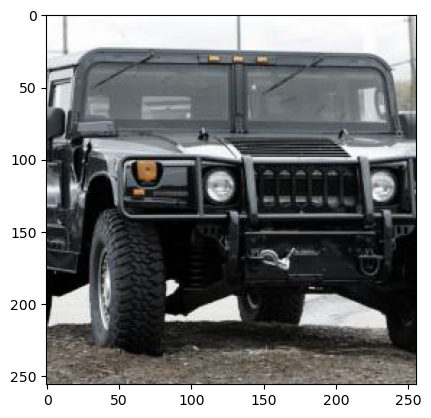

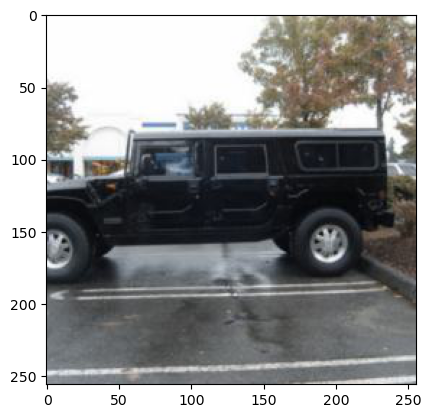

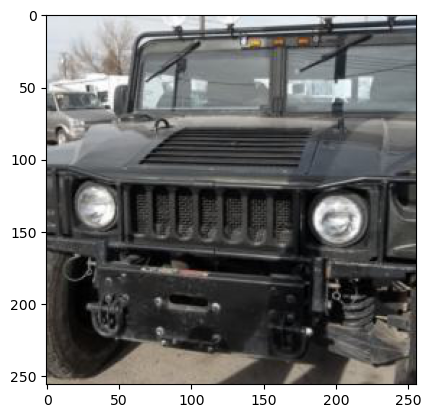

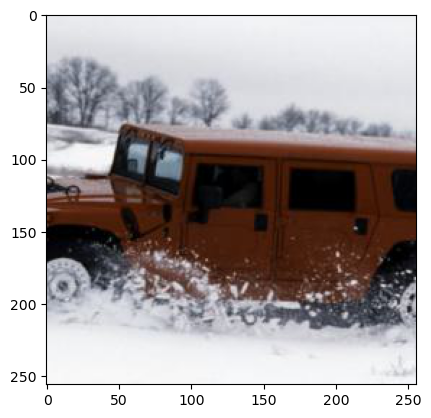

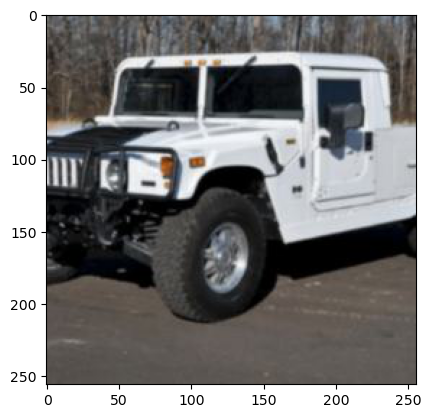

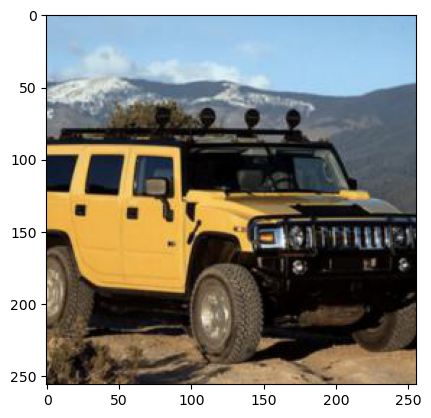

Sample time taken:  0.04933559497197469  minutes
Full run time estimated:  40.71173297087351  minutes


In [31]:
sample_run(run_name = 'Defaults', blur = True, blur_sigma = 0.75, target_size = 256, timer = True)

### Blur with Sigma 0.5, Target Size 256x256

C:\Users\ijyli\AppData\Local\Temp\ipykernel_9968\1240829104.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resizing_sample['destination_file_path'] = "~/Box/INFO 290T Project/Intermediate Data/Small Resized Sample/" + run_name + "/" + resizing_sample['destination_file_name']


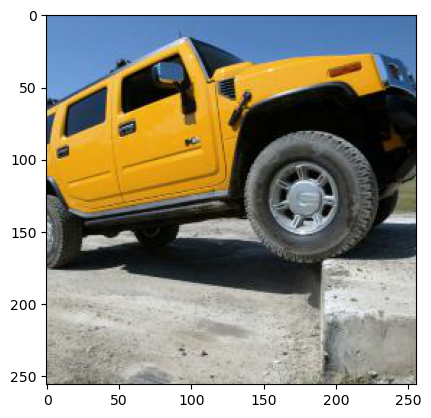

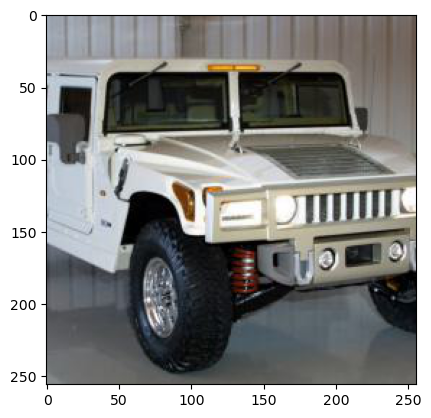

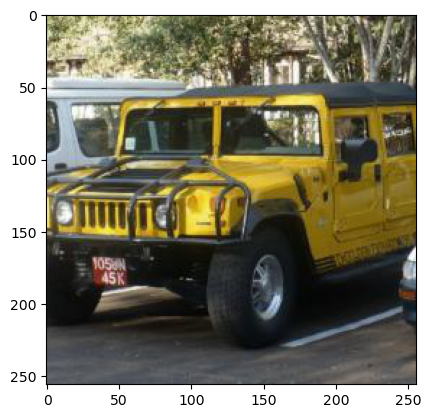

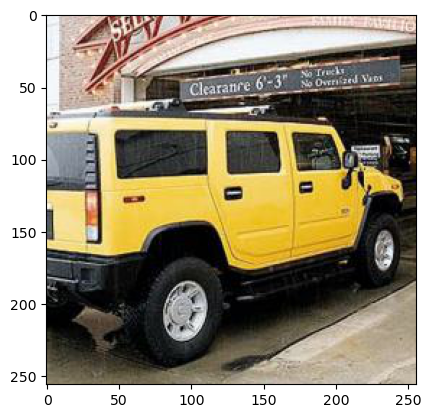

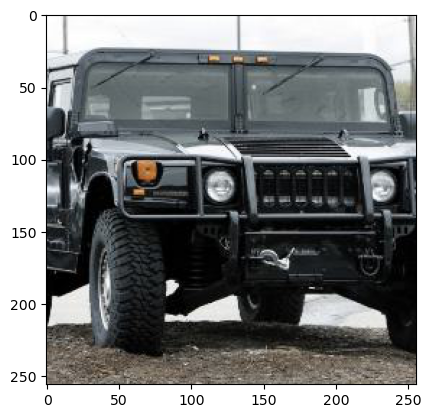

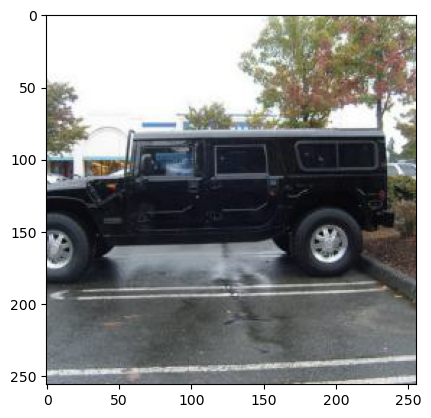

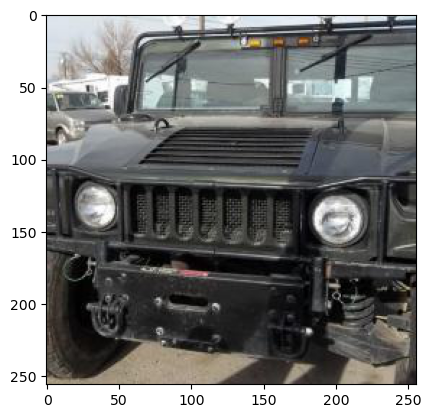

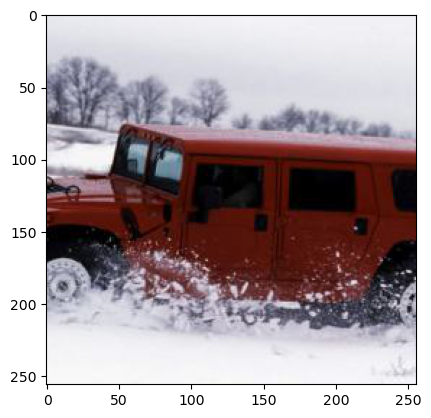

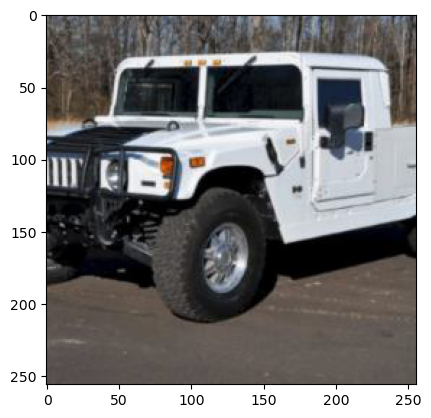

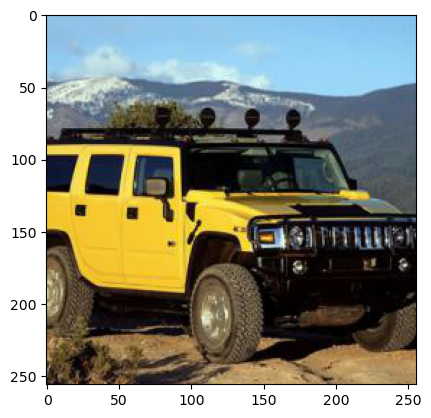

In [32]:
sample_run(run_name = 'Sigma 0 5', blur = True, blur_sigma = 0.5, target_size = 256, timer = False)

### Blur with Sigma 0.25, Target Size 256x256

C:\Users\ijyli\AppData\Local\Temp\ipykernel_9968\1240829104.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resizing_sample['destination_file_path'] = "~/Box/INFO 290T Project/Intermediate Data/Small Resized Sample/" + run_name + "/" + resizing_sample['destination_file_name']


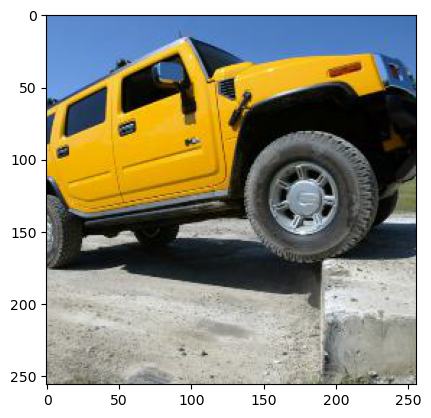

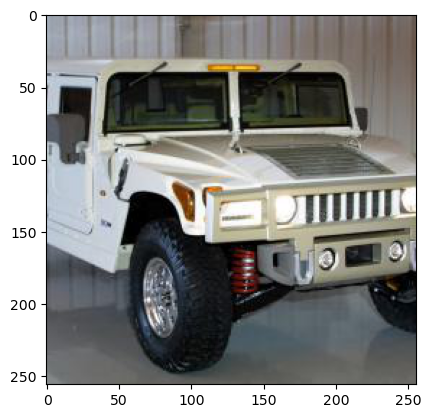

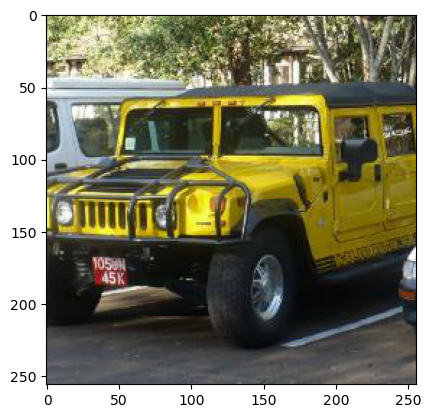

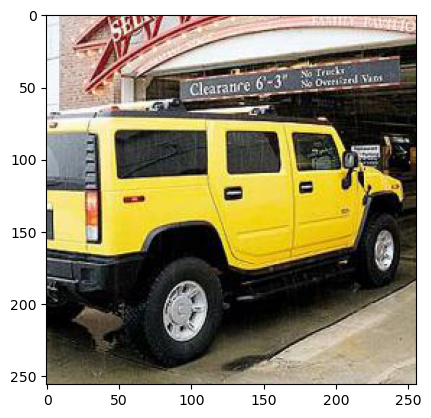

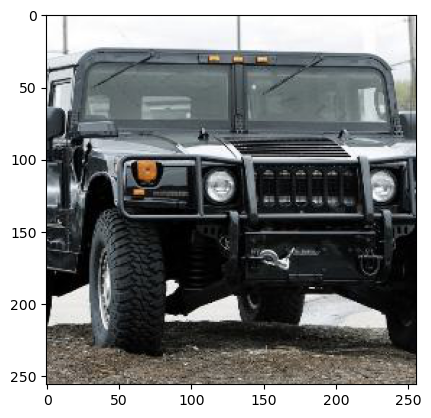

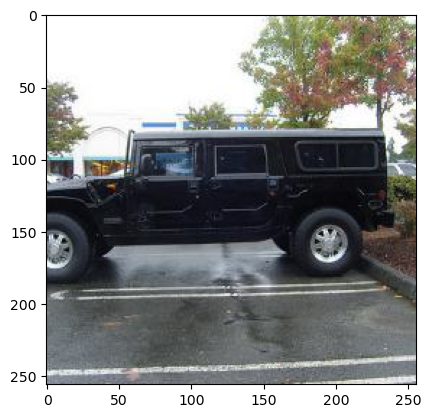

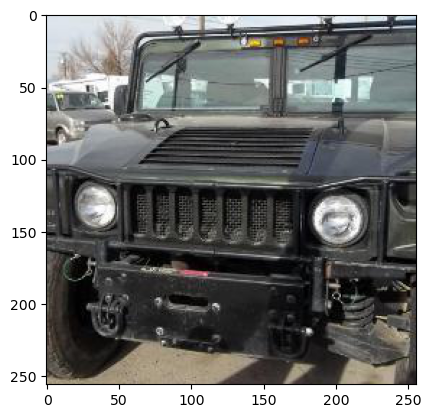

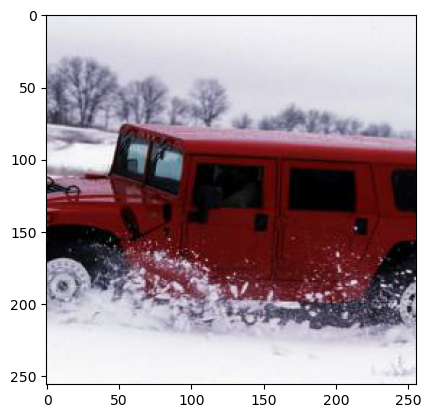

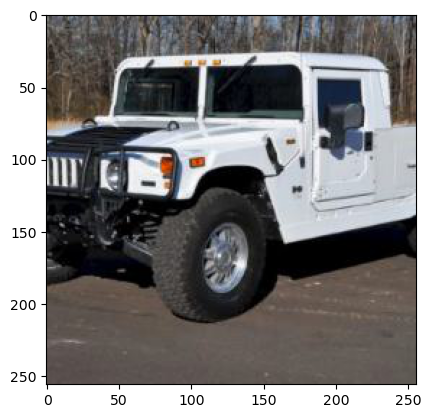

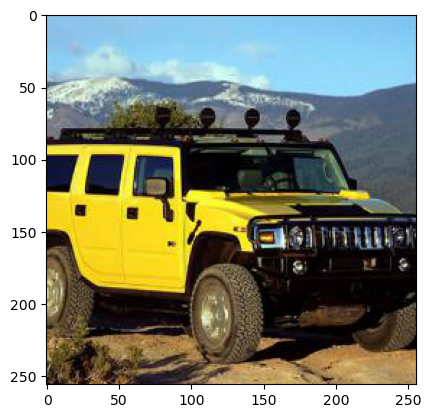

In [33]:
sample_run(run_name = 'Sigma 0 25', blur = True, blur_sigma = 0.25, target_size = 256, timer = False)

### Blur with Sigma 1, Target Size 256x256

C:\Users\ijyli\AppData\Local\Temp\ipykernel_9968\1240829104.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resizing_sample['destination_file_path'] = "~/Box/INFO 290T Project/Intermediate Data/Small Resized Sample/" + run_name + "/" + resizing_sample['destination_file_name']


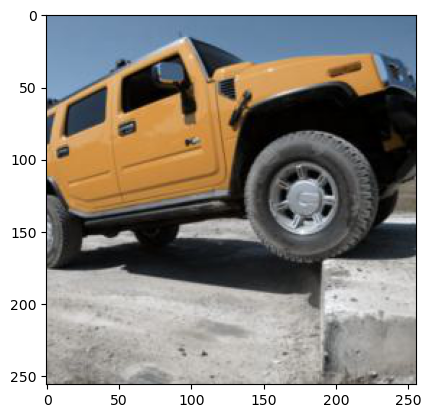

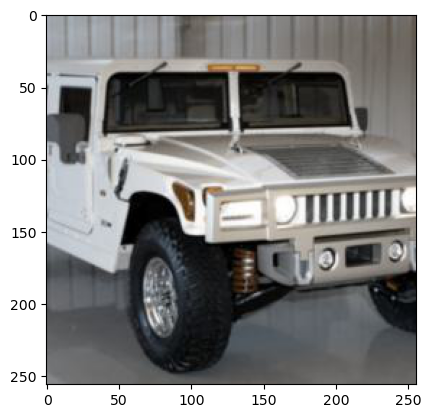

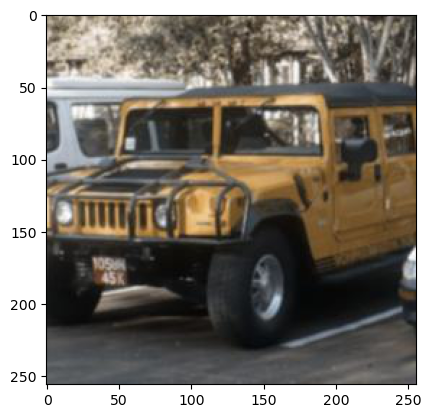

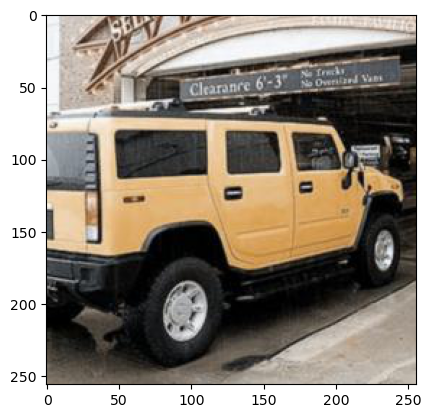

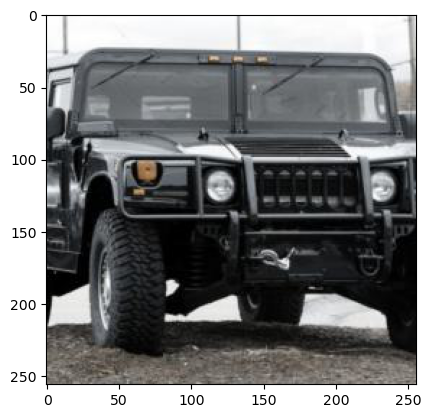

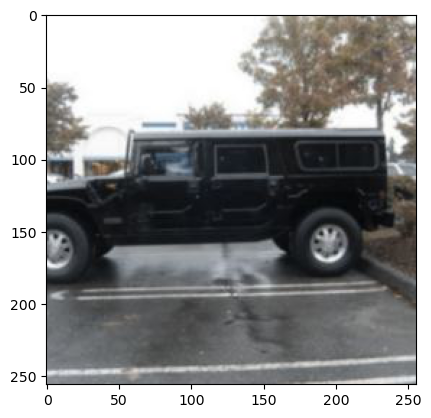

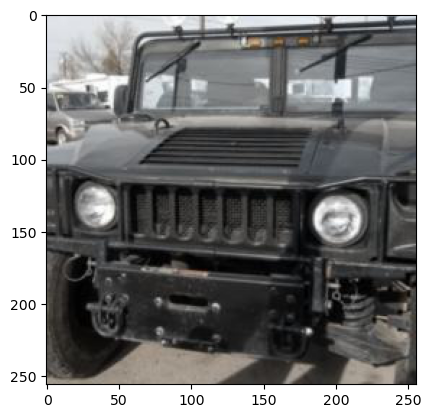

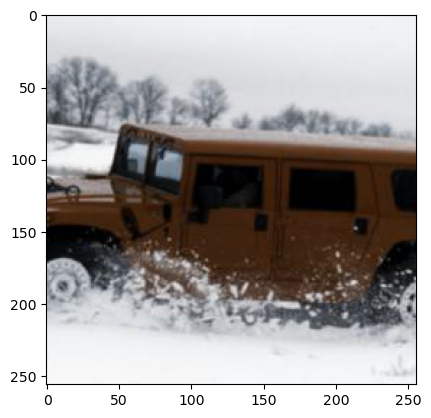

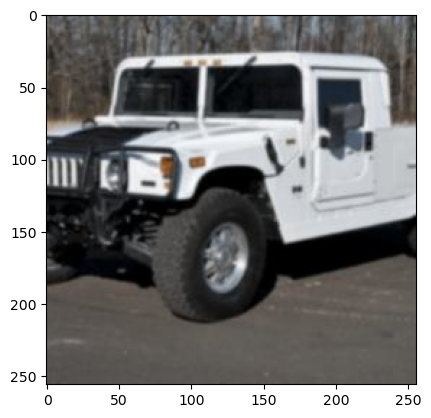

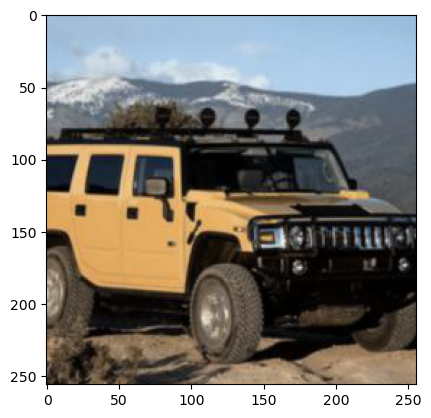

In [34]:
sample_run(run_name = 'Sigma 1', blur = True, blur_sigma = 1, target_size = 256, timer = False)

### No Blur, Target Size 256x256

C:\Users\ijyli\AppData\Local\Temp\ipykernel_9968\1240829104.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resizing_sample['destination_file_path'] = "~/Box/INFO 290T Project/Intermediate Data/Small Resized Sample/" + run_name + "/" + resizing_sample['destination_file_name']


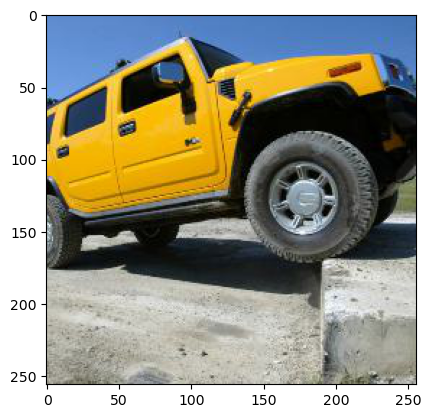

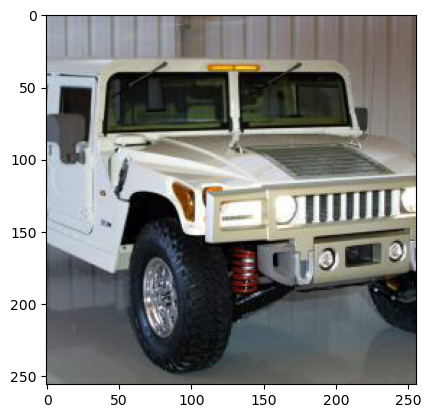

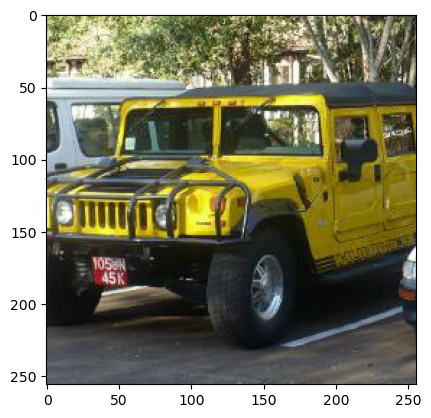

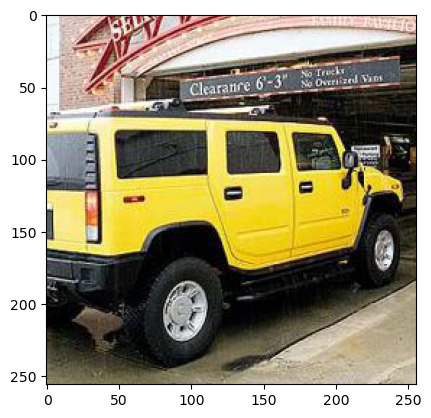

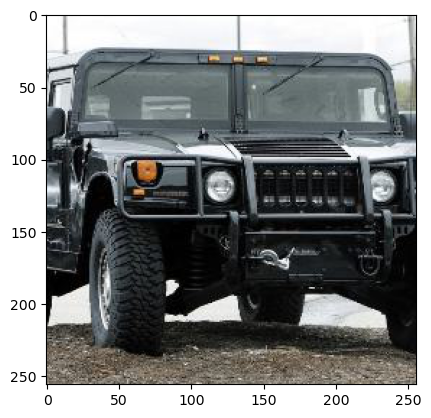

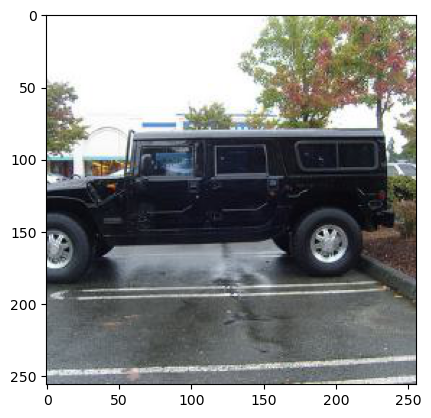

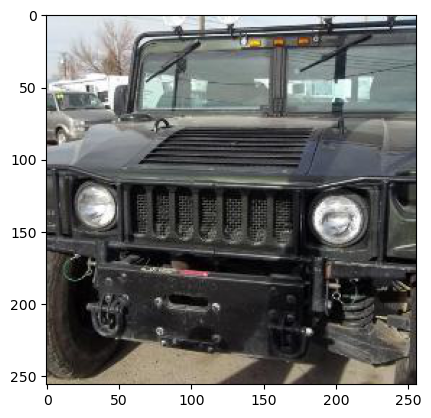

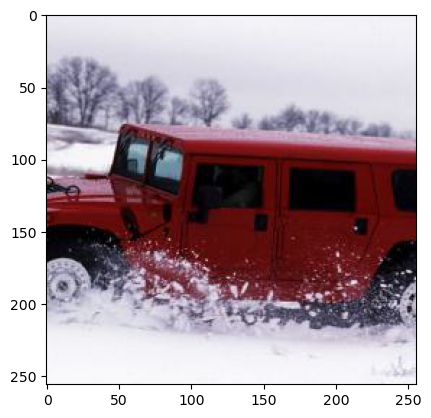

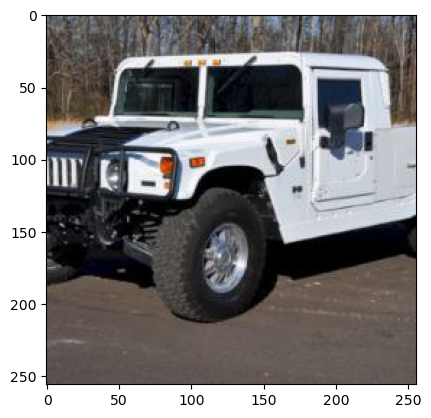

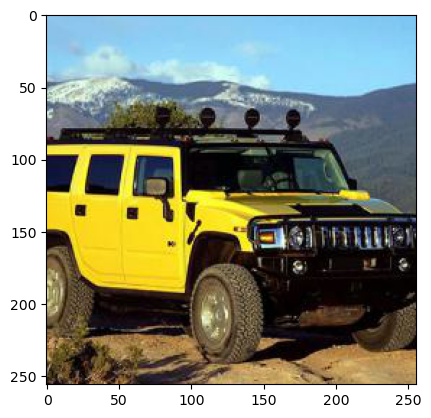

In [35]:
sample_run(run_name = 'No Blur', blur = False, target_size = 256, timer = False)
